# Analyze Path-Integrating Recurrent Neural Networks

### Set Up + Imports

In [1]:
import setup

setup.main()
%load_ext autoreload
%autoreload 2
# %load_ext jupyter_black

import neurometry.datasets.synthetic as synthetic
from neurometry.datasets.load_rnn_grid_cells import plot_rate_map
from neurometry.datasets.rnn_grid_cells.scores import GridScorer
import numpy as np

import matplotlib.pyplot as plt


import os

os.environ["GEOMSTATS_BACKEND"] = "pytorch"
import geomstats.backend as gs
import torch

from tqdm import tqdm

Working directory:  /home/facosta/neurometry/neurometry
Directory added to path:  /home/facosta/neurometry
Directory added to path:  /home/facosta/neurometry/neurometry


2024-05-16 01:17:27.122166: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-16 01:17:27.799932: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
INFO: Note: detected 128 virtual cores but NumExpr set to maximum of 64, check "NUMEXPR_MAX_THREADS" environment variable.
INFO: Note: NumExpr detected 128 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO: NumExpr defaulting to 8 threads.


## Single-Agent RNN

### Load activations across training epochs

In [2]:
import sys

path = os.path.join(os.getcwd(), "datasets/rnn_grid_cells")
sys.path.append(path)
from neurometry.datasets.load_rnn_grid_cells import load_activations

In [35]:
import argparse

import torch


class Config:
    save_dir = "models/"  # directory to save trained models
    n_epochs = 1  # number of training epochs
    n_steps = 1  # batches per epoch
    batch_size = 1000  # number of trajectories per batch
    sequence_length = 20  # number of steps in trajectory
    learning_rate = 1e-4  # gradient descent learning rate
    Np = 512  # number of place cells
    Ng = 4096  # number of grid cells
    place_cell_rf = 0.12  # width of place cell center tuning curve (m)
    DoG = True  # use difference of gaussians tuning curves
    surround_scale = 2  # if DoG, ratio of sigma2^2 to sigma1^2
    RNN_type = "RNN"  # RNN or LSTM
    activation = "relu"  # recurrent nonlinearity
    weight_decay = 1e-6  # strength of weight decay on recurrent weights
    periodic = False  # trajectories with periodic boundary conditions
    box_width = 2.2  # width of training environment
    box_height = 2.2  # height of training environment
    # device = (
    #     "cuda" if torch.cuda.is_available() else "cpu"
    # )  # device to use for training
    device = torch.device("cuda:7")
    n_avg = 50  # number of trajectories to average over for rate maps


# If you need to access the configuration as a dictionary
config = Config.__dict__


def create_parser(config):
    parser = argparse.ArgumentParser()

    for attr, value in config.items():
        if not attr.startswith("__"):
            parser.add_argument(
                f"--{attr}", type=type(value), default=value, help=f"default: {value}"
            )

    return parser


parser = create_parser(config)
options, unknown = parser.parse_known_args()

In [57]:
from neurometry.datasets.rnn_grid_cells.model import RNN
from neurometry.datasets.rnn_grid_cells.place_cells import PlaceCells
from neurometry.datasets.rnn_grid_cells.scores import GridScorer
from neurometry.datasets.rnn_grid_cells.trajectory_generator import TrajectoryGenerator
from neurometry.datasets.rnn_grid_cells.utils import generate_run_ID


options.run_ID = generate_run_ID(options)

place_cells = PlaceCells(options)
if options.RNN_type == "RNN":
    model = RNN(options, place_cells)
elif options.RNN_type == "LSTM":
    raise NotImplementedError

print("Creating trajectory generator...")

trajectory_generator = TrajectoryGenerator(options, place_cells)

print("Loading single agent model...")

model_single_agent = model.to(options.device)

file_path = "datasets/rnn_grid_cells/Single agent path integration high res/Seed 0/steps_20_batch_200_RNN_4096_relu_rf_012_DoG_True_periodic_False_lr_00001_weight_decay_1e-06"
epoch = 10

model_name = "final_model.pth" if epoch == "final" else f"epoch_{epoch}.pth"
model_path = os.path.join(file_path, model_name)
saved_model_single_agent = torch.load(model_path)
model_single_agent.load_state_dict(saved_model_single_agent)

Creating trajectory generator...
Loading single agent model...


<All keys matched successfully>

In [60]:
from neurometry.datasets.rnn_grid_cells.visualize import compute_ratemaps

print("Computing ratemaps and activations...")

Ng = options.Ng
n_avg = options.n_avg
res = 20

(
    activations_single_agent,
    rate_map_single_agent,
    g_single_agent,
    positions_single_agent,
) = compute_ratemaps(
    model_single_agent,
    trajectory_generator,
    options,
    res=res,
    n_avg=50,
    Ng=Ng,
    all_activations_flag=True,
)

Computing ratemaps and activations...


Processing:   0%|          | 0/50 [00:00<?, ?it/s]

Processing: 100%|██████████| 50/50 [04:03<00:00,  4.86s/it]


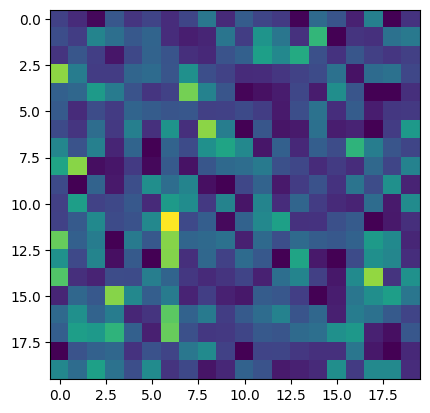

In [56]:
# rm = activations_single_agent.mean(axis=-1)
plt.imshow(rm[0]);

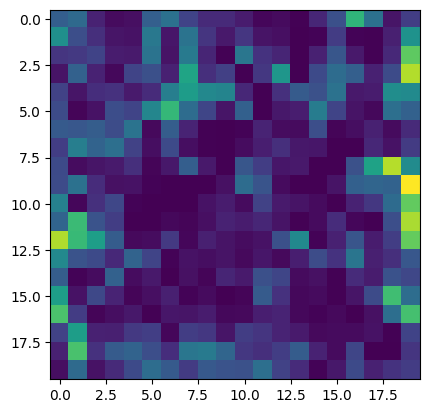

In [63]:
rm_10 = activations_single_agent.mean(axis=-1)
plt.imshow(rm_10[2653]);

In [ ]:
file_path = "datasets/rnn_grid_cells/Single agent path integration high res/Seed 0/steps_20_batch_200_RNN_4096_relu_rf_012_DoG_True_periodic_False_lr_00001_weight_decay_1e-06"
epochs = ["final"]
(activations, rate_maps, state_points) = load_activations(
    epochs, file_path, version="single", verbose=True
)

single_agent_positions has shape (batch_size $\times$ sequence_length $\times$ n_avg, 2)

In [32]:
box_width = 2.2
res = 20


def downsample_positions(positions, box_width, res):
    bin_edges = np.linspace(-box_width / 2, box_width / 2, res + 1)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    bin_indices_x = np.digitize(positions[:, 0], bins=bin_edges, right=True) - 1
    bin_indices_y = np.digitize(positions[:, 1], bins=bin_edges, right=True) - 1
    bin_indices_x = np.clip(bin_indices_x, 0, res - 1)
    bin_indices_y = np.clip(bin_indices_y, 0, res - 1)
    assigned_positions = np.zeros_like(positions)
    assigned_positions[:, 0] = bin_centers[bin_indices_x]
    assigned_positions[:, 1] = bin_centers[bin_indices_y]
    return assigned_positions


new_positions = downsample_positions(single_agent_positions[0], box_width, res)

In [67]:
final_representation = single_agent_rate_maps[0].T

print(final_representation.shape)


box_width = 2.2
res = 20

bin_edges = np.linspace(-box_width / 2, box_width / 2, res + 1)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

x_centers, y_centers = np.meshgrid(bin_centers, bin_centers[::-1])

positions_array = np.stack([x_centers, y_centers], axis=-1)

# Flatten the coordinate array to shape (400, 2)
positions = positions_array.reshape(-1, 2)


print(positions.shape)

(400, 4096)
(400, 2)


In [4]:
from neurometry.dimension.dimension import evaluate_pls_with_different_K
from neurometry.dimension.dimension import evaluate_PCA_with_different_K

In [73]:
X = final_representation
Y = positions

N = 200

K_values = [i for i in range(1, N + 1, 20)]

pls_r2_scores, pls_transformed_X = evaluate_pls_with_different_K(X, Y, K_values)

pca_r2_scores, pca_transformed_X = evaluate_PCA_with_different_K(X, Y, K_values)

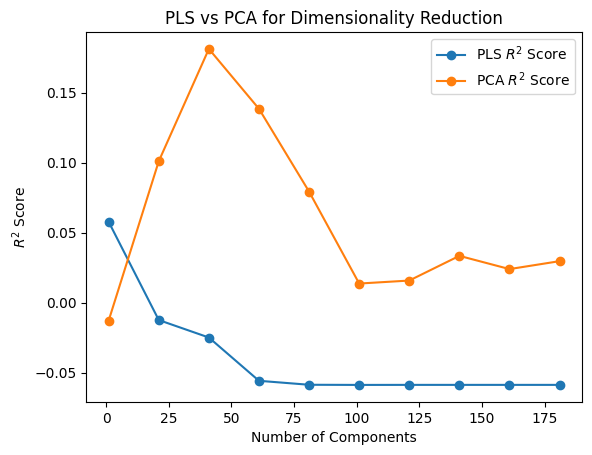

In [74]:
plt.plot(K_values, pls_r2_scores, marker="o", label="PLS $R^2$ Score")

plt.plot(K_values, pca_r2_scores, marker="o", label="PCA $R^2$ Score")

plt.xlabel("Number of Components")

plt.ylabel("$R^2$ Score")

plt.title("PLS vs PCA for Dimensionality Reduction")

plt.legend();

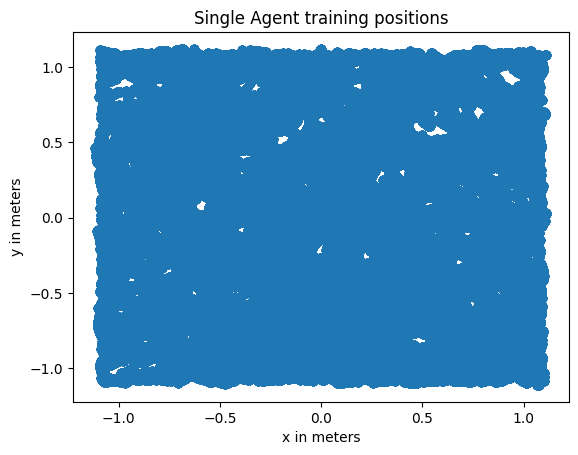

In [20]:
# plot scatter of single_agent_positions
plt.rcParams["text.usetex"] = False

x = single_agent_positions[0][:, 0]
y = single_agent_positions[0][:, 1]

plt.scatter(x, y)
plt.title("Single Agent training positions")
plt.xlabel("x in meters")
plt.ylabel("y in meters");

In [18]:
res = 20
pos = np.zeros((res * res, 2))
print(pos.shape)

(400, 2)


Epoch final found.
Loaded epochs ['final'] of dual agent model.
activations has shape (4096, 20, 20, 5). There are 4096 grid cells with 20 x 20 environment resolution, averaged over 5 trajectories.
state_points has shape (4096, 2000). There are 2000 data points in the 4096-dimensional state space.
rate_maps has shape (4096, 400). There are 400 data points averaged over 5 trajectories in the 4096-dimensional state space.


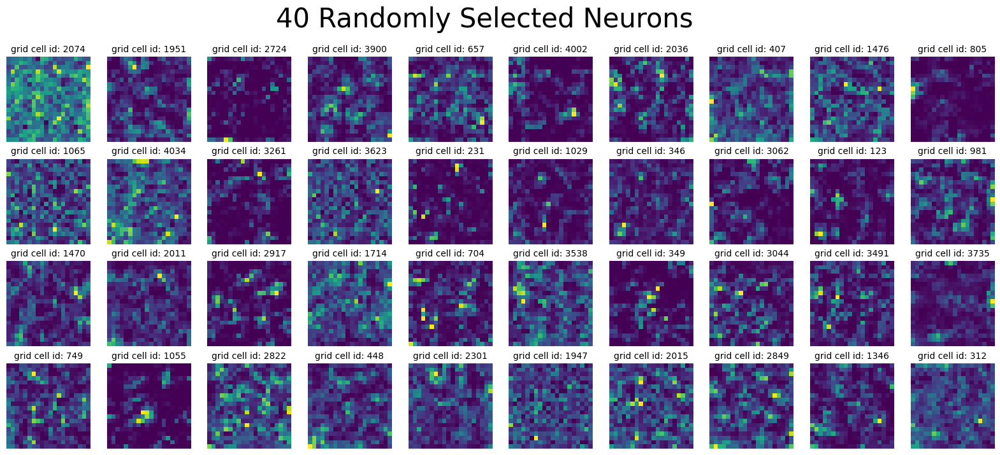

In [88]:
# epochs = list(range(0, 100, 5))
# epochs.append("final")

# file path for 'SA'
sa_file_path = "datasets/rnn_grid_cells/Single agent path integration/Seed 1 weight decay 1e-06/steps_20_batch_200_RNN_4096_relu_rf_012_DoG_True_periodic_False_lr_00001_weight_decay_1e-06"

# file path for 'SA high res'
sa_hr_file_path = "datasets/rnn_grid_cells/Single agent path integration high res/Seed 0/steps_20_batch_200_RNN_4096_relu_rf_012_DoG_True_periodic_False_lr_00001_weight_decay_1e-06"

# file_path for 'DA'
da_file_path = "datasets/rnn_grid_cells/Dual agent path integration disjoint PCs/Seed 1 weight decay 1e-06/steps_20_batch_200_RNN_4096_relu_rf_012_DoG_True_periodic_False_lr_00001_weight_decay_1e-06"

# file_path for 'DA high res'
da_hr_file_path = "datasets/rnn_grid_cells/Dual agent path integration high res/Seed 0/steps_20_batch_200_RNN_4096_relu_rf_012_DoG_True_periodic_False_lr_00001_weight_decay_1e-06"

file_path = da_hr_file_path

epochs = ["final"]
(
    single_agent_activations,
    single_agent_rate_maps,
    single_agent_state_points,
) = load_activations(epochs, file_path, version="dual", verbose=True)

plot_rate_map(
    None, 40, single_agent_activations[-1], title="40 Randomly Selected Neurons"
)

### Plot final activations

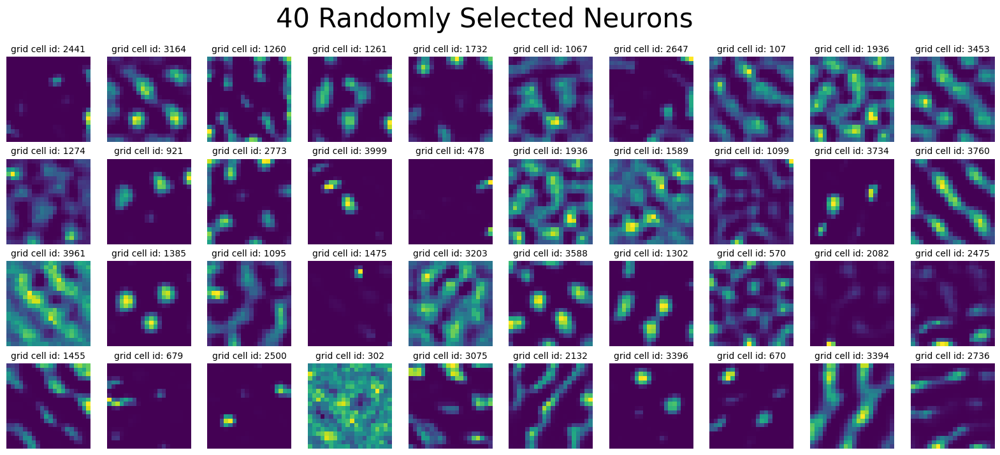

In [80]:
plot_rate_map(
    None, 40, single_agent_activations[-1], title="40 Randomly Selected Neurons"
)

### Load Training Loss

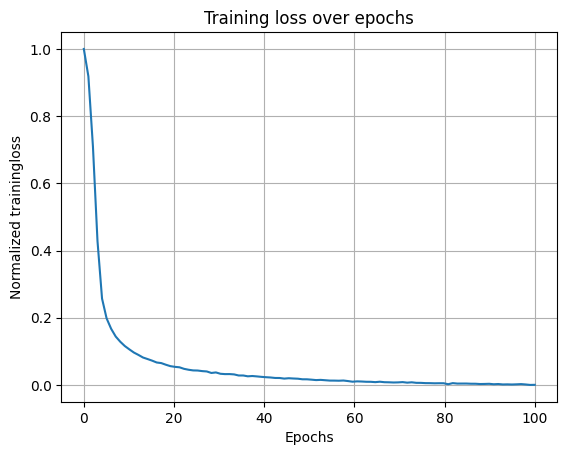

In [43]:
model_folder = "Single agent path integration/Seed 1 weight decay 1e-06/"
model_parameters = "steps_20_batch_200_RNN_4096_relu_rf_012_DoG_True_periodic_False_lr_00001_weight_decay_1e-06/"

loss_path = (
    "/scratch/facosta/rnn_grid_cells/" + model_folder + model_parameters + "loss.npy"
)

loss = np.load(loss_path)

loss_aggregated = np.mean(loss.reshape(-1, 1000), axis=1)

loss_normalized = (loss_aggregated - np.min(loss_aggregated)) / (
    np.max(loss_aggregated) - np.min(loss_aggregated)
)

plt.plot(np.linspace(0, 100, 100), loss_normalized)
plt.xlabel("Epochs")
plt.ylabel("Normalized trainingloss")
plt.title("Training loss over epochs")
plt.grid()

### Extract representations from epoch = 0  to epoch = 100 (final)

In [16]:
representations = []

for rep in single_agent_rate_maps:
    points = rep.T
    norm_points = points / np.linalg.norm(points, axis=1)[:, None]
    representations.append(norm_points)

In [17]:
print(
    f"There are {representations[0].shape[0]} points in {representations[0].shape[1]}-dimensional space"
)

There are 400 points in 4096-dimensional space


### Compute Persistent Homology using $\texttt{giotto-tda}$

In [52]:
from gtda.homology import WeakAlphaPersistence, VietorisRipsPersistence
from gtda.diagrams import PairwiseDistance
from gtda.plotting import plot_diagram, plot_heatmap
import neurometry.datasets.synthetic as synthetic

ModuleNotFoundError: No module named 'gtda'

Load synthetic 1-sphere, 2-sphere, and 2-torus neural manifolds

In [20]:
num_points = representations[0].shape[0]
embedding_dim = representations[0].shape[1]

task_points_circle = synthetic.hypersphere(intrinsic_dim=1, num_points=num_points)

_, circle_points = synthetic.synthetic_neural_manifold(
    points=task_points_circle,
    encoding_dim=embedding_dim,
    nonlinearity="linear",
)

norm_circle_points = circle_points / np.linalg.norm(circle_points, axis=1)[:, None]

task_points_sphere = synthetic.hypersphere(intrinsic_dim=2, num_points=num_points)

_, sphere_points = synthetic.synthetic_neural_manifold(
    points=task_points_sphere,
    encoding_dim=embedding_dim,
    nonlinearity="linear",
)

norm_sphere_points = sphere_points / np.linalg.norm(sphere_points, axis=1)[:, None]

task_points_sphere3 = synthetic.hypersphere(intrinsic_dim=3, num_points=num_points)

_, sphere3_points = synthetic.synthetic_neural_manifold(
    points=task_points_sphere3,
    encoding_dim=embedding_dim,
    nonlinearity="linear",
)

norm_sphere3_points = sphere3_points / np.linalg.norm(sphere3_points, axis=1)[:, None]


torus_task_points = synthetic.hypertorus(intrinsic_dim=2, num_points=num_points)

_, torus_points = synthetic.synthetic_neural_manifold(
    points=torus_task_points,
    encoding_dim=embedding_dim,
    nonlinearity="linear",
)

norm_torus_points = torus_points / np.linalg.norm(torus_points, axis=1)[:, None]


torus3_task_points = synthetic.hypertorus(intrinsic_dim=3, num_points=num_points)

_, torus3_points = synthetic.synthetic_neural_manifold(
    points=torus3_task_points,
    encoding_dim=embedding_dim,
    nonlinearity="linear",
)

norm_torus3_points = torus3_points / np.linalg.norm(torus3_points, axis=1)[:, None]

WARNING! Poisson spikes not generated: mean must be non-negative
WARNING! Poisson spikes not generated: mean must be non-negative
WARNING! Poisson spikes not generated: mean must be non-negative
WARNING! Poisson spikes not generated: mean must be non-negative
WARNING! Poisson spikes not generated: mean must be non-negative


In [12]:
num_points = 100

embedding_dim = 10

task_points_circle = synthetic.hypersphere(intrinsic_dim=1, num_points=num_points)

noisy_circle_points, circle_points = synthetic.synthetic_neural_manifold(
    points=task_points_circle,
    encoding_dim=embedding_dim,
    nonlinearity="tanh",
    poisson_multiplier=1,
    scales=torch.ones(embedding_dim),
)

print(
    f"There are {circle_points.shape[0]} points in {circle_points.shape[1]}-dimensional space"
)

noise level: 7.07%
There are 100 points in 10-dimensional space


In [13]:
num_points = 100

embedding_dim = 10

task_points_sphere2 = synthetic.hypersphere(intrinsic_dim=2, num_points=num_points)

noisy_sphere2_points, sphere2_points = synthetic.synthetic_neural_manifold(
    points=task_points_sphere2,
    encoding_dim=embedding_dim,
    nonlinearity="tanh",
    poisson_multiplier=1,
    scales=torch.ones(embedding_dim),
)

print(
    f"There are {sphere2_points.shape[0]} points in {sphere2_points.shape[1]}-dimensional space"
)

noise level: 7.07%
There are 100 points in 10-dimensional space


In [ ]:
num_points = 100

embedding_dim = 10

task_points_torus2 = synthetic.hypertorus(intrinsic_dim=2, num_points=num_points)

noisy_torus2_points, torus2_points = synthetic.synthetic_neural_manifold(
    points=task_points_torus2,
    encoding_dim=embedding_dim,
    nonlinearity="tanh",
    poisson_multiplier=1,
    scales=torch.ones(embedding_dim),
)

print(
    f"There are {torus2_points.shape[0]} points in {sphere2_points.shape[1]}-dimensional space"
)

Load or Compute Vietoris-Rips persistence diagrams

In [21]:
homology_dimensions = (
    0,
    1,
    2,
    3,
)
VR = VietorisRipsPersistence(homology_dimensions=homology_dimensions)

In [22]:
try:
    print("Loading Vietoris-Rips persistence diagrams")
    vr_diagrams = np.load("datasets/rnn_grid_cells/single_agent_vr_pers_diagrams.npy")

except:
    print("Computing Vietoris-Rips persistence diagrams")
    vr_diagrams = VR.fit_transform(
        representations
        + [norm_circle_points]
        + [norm_sphere_points]
        + [norm_torus_points]
        + [norm_sphere3_points]
        + [norm_torus3_points]
    )
    np.save("datasets/rnn_grid_cells/single_agent_vr_pers_diagrams.npy", vr_diagrams)


print(
    f"There are {vr_diagrams.shape[0]} persistence diagrams. Each diagram has {vr_diagrams.shape[1]} features (points)."
)

Loading Vietoris-Rips persistence diagrams
There are 25 persistence diagrams. Each diagram has 1635 features (points).


Each feature is a triple $[b, d, q]$, where $q$ is the dimension, $b$ is the birth time, $d$ is the death time

In [23]:
fig_torus3 = plot_diagram(
    vr_diagrams[-1],
    plotly_params={"title": "Vietoris-Rips Persistence Diagram, 3-torus"},
)
fig_torus3.update_layout(title="Vietoris-Rips Persistence Diagram, 3-torus")

Note: the Poincaré polynomial of a surface is the generating function of its Betti numbers. 

the Poincaré polynomial of an $n$-torus is $(1+x)^n$, by the Künneth theorem. The Betti numbers are therefore the binomial coefficients.

Thus for the $3$-torus, the non-zero Betti numbers are $(1,3,3,1)$.

In [13]:
fig_sphere3 = plot_diagram(
    vr_diagrams[-2],
    plotly_params={"title": "Vietoris-Rips Persistence Diagram, 3-sphere"},
)
fig_sphere3.update_layout(title="Vietoris-Rips Persistence Diagram, 3-sphere")

In [14]:
fig_rep_final = plot_diagram(
    vr_diagrams[-6],
    plotly_params={"title": "Vietoris-Rips Persistence Diagram, final representation"},
)
fig_rep_final.update_layout(
    title="Vietoris-Rips Persistence Diagram, final representation"
)

### Compute pairwise topological distance ("landscape")

In [15]:
landscape_PD = PairwiseDistance(metric="landscape", n_jobs=-1)

landscape_distance = landscape_PD.fit_transform(vr_diagrams)

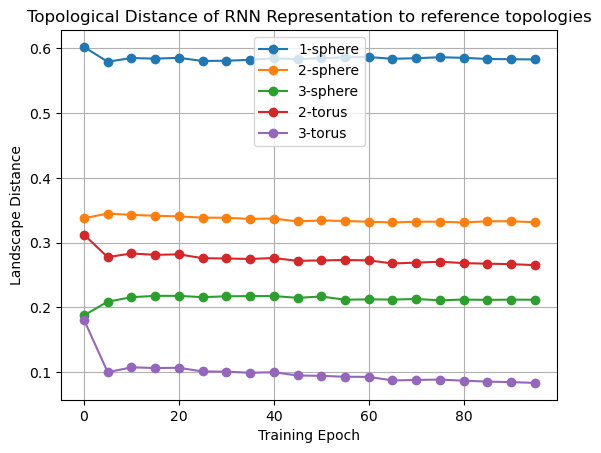

In [20]:
landscape_distance_to_circle = landscape_distance[-5, :-5]
landscape_distance_to_sphere = landscape_distance[-4, :-5]
landscape_distance_to_torus = landscape_distance[-3, :-5]
landscape_distance_to_sphere3 = landscape_distance[-2, :-5]
landscape_distance_to_torus3 = landscape_distance[-1, :-5]
plt.plot(epochs[:-1], landscape_distance_to_circle, "o-", label="1-sphere")
plt.plot(epochs[:-1], landscape_distance_to_sphere, "o-", label="2-sphere")
plt.plot(epochs[:-1], landscape_distance_to_sphere3, "o-", label="3-sphere")
plt.plot(epochs[:-1], landscape_distance_to_torus, "o-", label="2-torus")
plt.plot(epochs[:-1], landscape_distance_to_torus3, "o-", label="3-torus")
plt.xlabel("Training Epoch")
plt.ylabel("Landscape Distance")
plt.title("Topological Distance of RNN Representation to reference topologies")
plt.grid()
plt.legend();

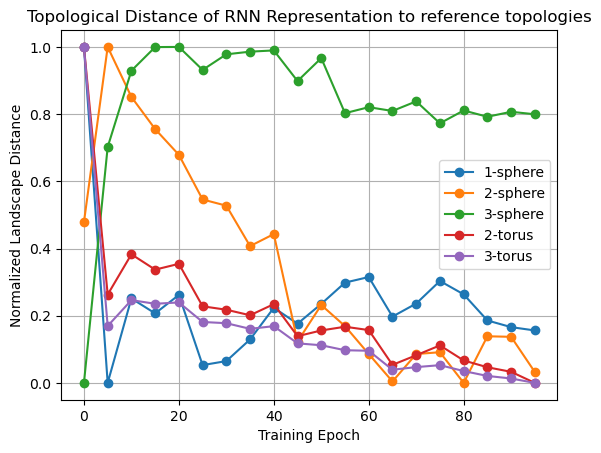

In [19]:
norm_landscape_distance_to_circle = (
    landscape_distance_to_circle - np.min(landscape_distance_to_circle)
) / (np.max(landscape_distance_to_circle) - np.min(landscape_distance_to_circle))

norm_landscape_distance_to_sphere = (
    landscape_distance_to_sphere - np.min(landscape_distance_to_sphere)
) / (np.max(landscape_distance_to_sphere) - np.min(landscape_distance_to_sphere))

norm_landscape_distance_to_sphere3 = (
    landscape_distance_to_sphere3 - np.min(landscape_distance_to_sphere3)
) / (np.max(landscape_distance_to_sphere3) - np.min(landscape_distance_to_sphere3))

norm_landscape_distance_to_torus = (
    landscape_distance_to_torus - np.min(landscape_distance_to_torus)
) / (np.max(landscape_distance_to_torus) - np.min(landscape_distance_to_torus))

norm_landscape_distance_to_torus3 = (
    landscape_distance_to_torus3 - np.min(landscape_distance_to_torus3)
) / (np.max(landscape_distance_to_torus3) - np.min(landscape_distance_to_torus3))

plt.plot(epochs, norm_landscape_distance_to_circle, "o-", label="1-sphere")
plt.plot(epochs, norm_landscape_distance_to_sphere, "o-", label="2-sphere")
plt.plot(epochs, norm_landscape_distance_to_sphere3, "o-", label="3-sphere")
plt.plot(epochs, norm_landscape_distance_to_torus, "o-", label="2-torus")
plt.plot(epochs, norm_landscape_distance_to_torus3, "o-", label="3-torus")
plt.xlabel("Training Epoch")
plt.ylabel("Normalized Landscape Distance")
plt.title("Topological Distance of RNN Representation to reference topologies")
plt.grid()
plt.legend();

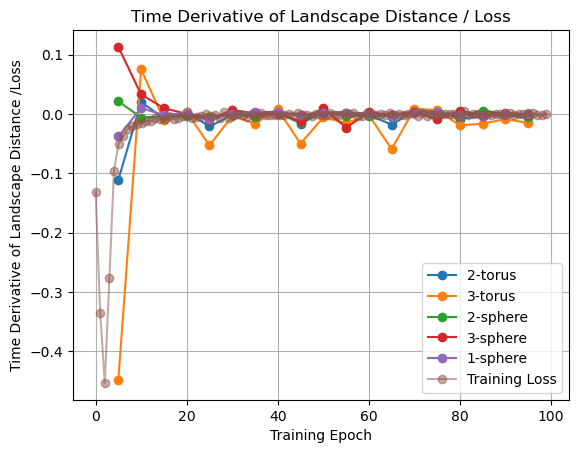

In [95]:
landscape_distance_to_torus_diff = (
    np.diff(landscape_distance_to_torus) / landscape_distance_to_torus[:-1]
)
landscape_distance_to_torus3_diff = (
    np.diff(landscape_distance_to_torus3) / landscape_distance_to_torus3[:-1]
)
landscape_distance_to_sphere_diff = (
    np.diff(landscape_distance_to_sphere) / landscape_distance_to_sphere[:-1]
)
landscape_distance_to_sphere3_diff = (
    np.diff(landscape_distance_to_sphere3) / landscape_distance_to_sphere3[:-1]
)
landscape_distance_to_circle_diff = (
    np.diff(landscape_distance_to_circle) / landscape_distance_to_circle[:-1]
)

loss_diff = np.diff(loss_normalized) / loss_aggregated[:-1]

plt.plot(epochs[1:], landscape_distance_to_torus_diff, "o-", label="2-torus")
plt.plot(epochs[1:], landscape_distance_to_torus3_diff, "o-", label="3-torus")
plt.plot(epochs[1:], landscape_distance_to_sphere_diff, "o-", label="2-sphere")
plt.plot(epochs[1:], landscape_distance_to_sphere3_diff, "o-", label="3-sphere")
plt.plot(epochs[1:], landscape_distance_to_circle_diff, "o-", label="1-sphere")
plt.plot(np.linspace(0, 99, 99), 10 * loss_diff, "o-", label="Training Loss", alpha=0.5)
plt.xlabel("Training Epoch")
plt.ylabel("Time Derivative of Landscape Distance /Loss")
plt.legend()
plt.title("Time Derivative of Landscape Distance / Loss")
plt.grid();

In [15]:
error_normalized = (error - np.min(error)) / (np.max(error) - np.min(error))
loss_normalized = (loss_aggregated - np.min(loss_aggregated)) / (
    np.max(loss_aggregated) - np.min(loss_aggregated)
)

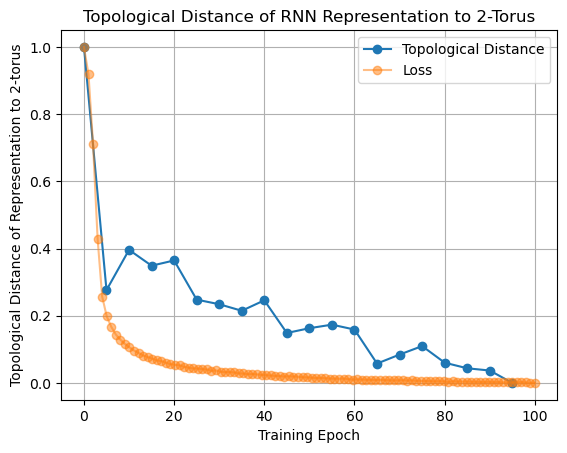

In [16]:
plt.plot(epochs, error_normalized, "o-", label="Topological Distance")
plt.plot(np.linspace(0, 100, 100), loss_normalized, "o-", alpha=0.5, label="Loss")
plt.xlabel("Training Epoch")
plt.ylabel("Topological Distance of Representation to 2-torus")
plt.title("Topological Distance of RNN Representation to 2-Torus")
plt.grid()
plt.legend();

In [23]:
fig_epoch_0 = plot_diagram(
    vr_diagrams[1],
    homology_dimensions=(0, 1, 2),
    plotly_params={"title": "Vietoris-Rips PD, single-agent RNN, epoch=0"},
)
fig_epoch_0.update_layout(title="Vietoris-Rips PD, single-agent RNN, epoch=0")

In [24]:
fig_epoch_95 = plot_diagram(
    vr_diagrams[-1],
    homology_dimensions=(0, 1, 2),
    plotly_params={"title": "Vietoris-Rips PD, single-agent RNN, epoch=95"},
)
fig_epoch_95.update_layout(title="Vietoris-Rips PD, single-agent RNN, epoch=95")

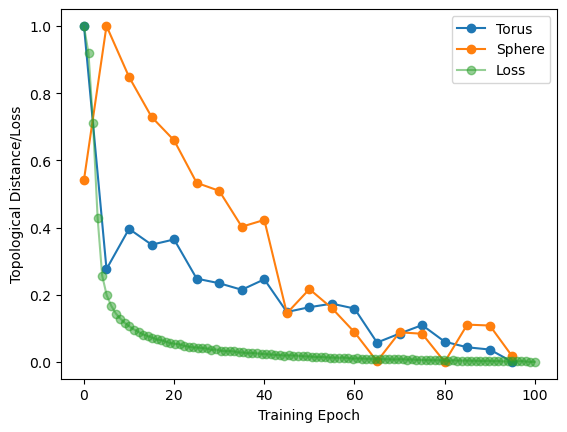

In [30]:
sphere_error_normalized = (sphere_error - np.min(sphere_error)) / (
    np.max(sphere_error) - np.min(sphere_error)
)

plt.plot(epochs, error_normalized, "o-", label="Torus")
plt.plot(epochs, sphere_error_normalized, "o-", label="Sphere")
plt.plot(np.linspace(0, 100, 100), loss_normalized, "o-", alpha=0.5, label="Loss")
plt.xlabel("Training Epoch")
plt.ylabel("Topological Distance/Loss")
plt.legend();

### Estimate rank of connectivity matrix

Get final model (epoch $=100$)

### Compare run-times of $\texttt{giotto-tda}, \texttt{ripser}, \texttt{giotto-ph}$

In [20]:
from gtda.homology import WeakAlphaPersistence, VietorisRipsPersistence
from ripser import ripser
from persim import plot_diagrams
from gph import ripser_parallel

import time


final_representation = representations[-1]


homology_dimensions = (
    0,
    1,
    2,
)
VR = VietorisRipsPersistence(homology_dimensions=homology_dimensions)


gtda_start = time.time()
gtda_vr_diagrams = VR.fit_transform([final_representation])
gtda_end = time.time()
print(
    f"Time to compute Vietoris-Rips persistence diagrams in giotto-tda: {gtda_end - gtda_start:.2f}"
)


ripser_start = time.time()
diagrams = ripser(representations[-1], maxdim=2)["dgms"]
ripser_end = time.time()
print(
    f"Time to compute Vietoris-Rips persistence diagrams in ripser: {ripser_end - ripser_start:.2f}"
)


gph_start = time.time()
gph_vr_diagrams = ripser_parallel(final_representation, maxdim=2, n_threads=-1)
gph_end = time.time()
print(
    f"Time to compute Vietoris-Rips persistence diagrams in giotto-ph: {gph_end - gph_start:.2f} sec"
)

Time to compute Vietoris-Rips persistence diagrams in giotto-tda: 4.770987272262573
Time to compute Vietoris-Rips persistence diagrams in ripser: 15.016701698303223
Time to compute Vietoris-Rips persistence diagrams in giotto-ph: 3.094177722930908


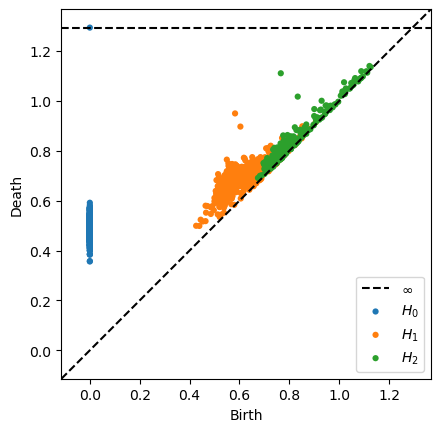

In [37]:
plot_diagrams(gph_vr_diagrams["dgms"])

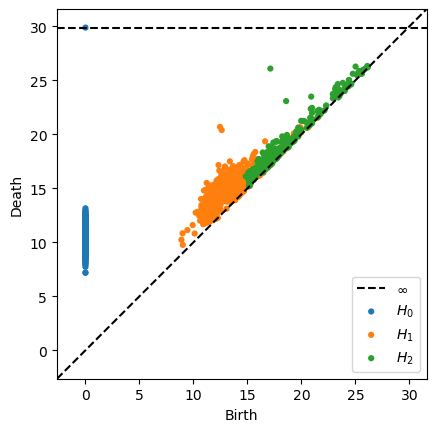

In [70]:
diags = ripser_parallel(
    representations[-1], maxdim=2, coeff=2, metric="manhattan", n_threads=-1
)["dgms"]

plot_diagrams(diags)

In [71]:
gph_diagrams = {}

for i in range(len(epochs)):
    gph_diagrams[epochs[i]] = ripser_parallel(
        representations[i], maxdim=2, coeff=2, metric="euclidean", n_threads=-1
    )["dgms"]

plot_diagrams(gph_diagrams["final"])

### Isolate Grid Cells (cells with high grid score)

In [18]:
grid_scores_all_epochs = []
band_scores_all_epochs = []
border_scores_all_epochs = []
for epoch in epochs:
    scores_dir = (
        "/scratch/facosta/rnn_grid_cells/" + model_folder + model_parameters + "scores/"
    )
    grid_scores_all_epochs.append(
        np.load(scores_dir + f"score_60_single_agent_epoch_{epoch}.npy")
    )
    band_scores_all_epochs.append(
        np.load(scores_dir + f"band_scores_single_agent_epoch_{epoch}.npy")
    )
    border_scores_all_epochs.append(
        np.load(scores_dir + f"border_scores_single_agent_epoch_{epoch}.npy")
    )

In [19]:
final_epoch_grid_score_sort = np.argsort(grid_scores_all_epochs[-1])
final_epoch_band_score_sort = np.argsort(band_scores_all_epochs[-1])
final_epoch_border_score_sort = np.argsort(border_scores_all_epochs[-1])

sorted_grid_scores_all_epochs = []
sorted_band_scores_all_epochs = []
sorted_border_scores_all_epochs = []

for grid_scores in grid_scores_all_epochs:
    sorted_grid_scores_all_epochs.append(grid_scores[final_epoch_grid_score_sort])

for band_scores in band_scores_all_epochs:
    sorted_band_scores_all_epochs.append(band_scores[final_epoch_band_score_sort])

for border_scores in border_scores_all_epochs:
    sorted_border_scores_all_epochs.append(border_scores[final_epoch_border_score_sort])

see 40 units with highest grid scores:

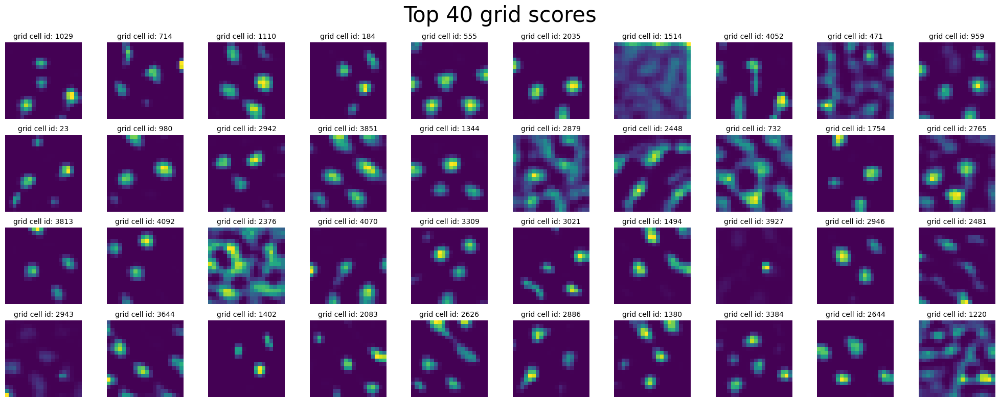

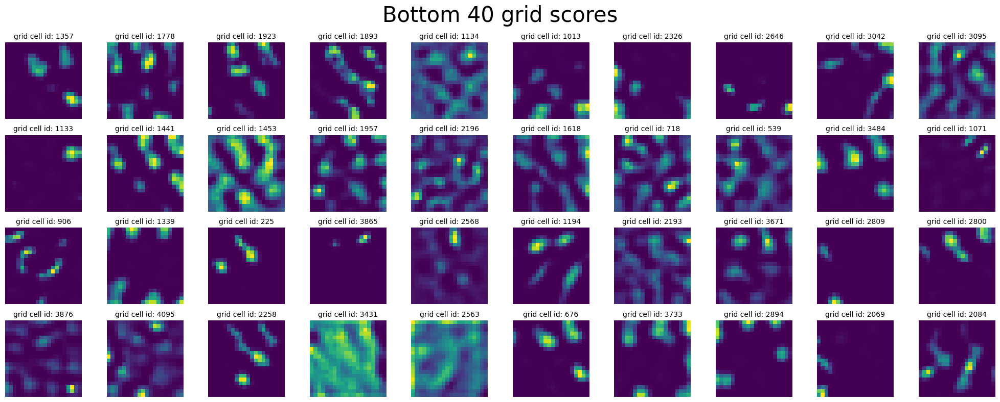

In [20]:
plot_rate_map(
    final_epoch_grid_score_sort[-40:],
    None,
    single_agent_activations[-1],
    title="Top 40 grid scores",
)

plot_rate_map(
    final_epoch_grid_score_sort[:40],
    None,
    single_agent_activations[-1],
    title="Bottom 40 grid scores",
)

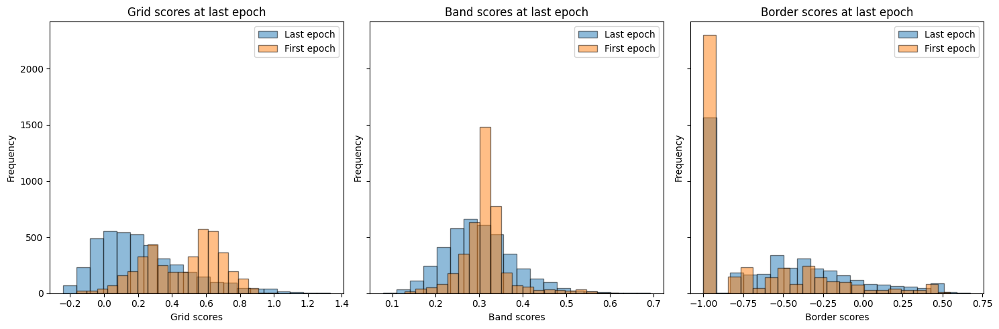

In [21]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

ax[0].hist(
    grid_scores_all_epochs[-1],
    bins=20,
    alpha=0.5,
    label="Last epoch",
    edgecolor="black",
)
ax[0].hist(
    grid_scores_all_epochs[0],
    bins=20,
    alpha=0.5,
    label="First epoch",
    edgecolor="black",
)
ax[0].set_xlabel("Grid scores")
ax[0].set_ylabel("Frequency")
ax[0].set_title("Grid scores at last epoch")
ax[0].legend()

ax[1].hist(
    band_scores_all_epochs[-1],
    bins=20,
    alpha=0.5,
    label="Last epoch",
    edgecolor="black",
)
ax[1].hist(
    band_scores_all_epochs[0],
    bins=20,
    alpha=0.5,
    label="First epoch",
    edgecolor="black",
)
ax[1].set_xlabel("Band scores")
ax[1].set_ylabel("Frequency")
ax[1].set_title("Band scores at last epoch")
ax[1].legend()


ax[2].hist(
    border_scores_all_epochs[-1],
    bins=20,
    alpha=0.5,
    label="Last epoch",
    edgecolor="black",
)
ax[2].hist(
    border_scores_all_epochs[0],
    bins=20,
    alpha=0.5,
    label="First epoch",
    edgecolor="black",
)
ax[2].set_xlabel("Border scores")
ax[2].set_ylabel("Frequency")
ax[2].set_title("Border scores at last epoch")
ax[2].legend()

plt.tight_layout()

In [22]:
num_top_bottom = 40

lowest_grid_scores_over_time = [
    np.mean(sorted_grid_scores_all_epochs[i][:num_top_bottom])
    for i in range(len(epochs))
]

top_grid_scores_over_time = [
    np.mean(sorted_grid_scores_all_epochs[i][-num_top_bottom:])
    for i in range(len(epochs))
]

average_grid_scores_over_time = [
    np.mean(sorted_grid_scores_all_epochs[i]) for i in range(len(epochs))
]

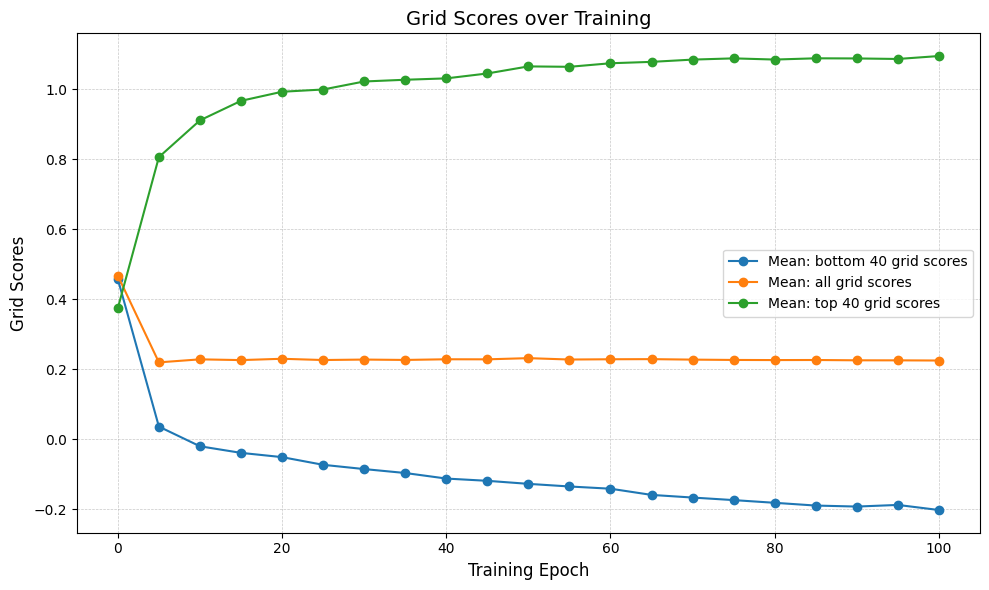

In [24]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.plot(
    epochs[:-1] + [100],
    lowest_grid_scores_over_time,
    "o-",
    label=f"Mean: bottom {num_top_bottom} grid scores",
)
ax.plot(
    epochs[:-1] + [100],
    average_grid_scores_over_time,
    "o-",
    label="Mean: all grid scores",
)
ax.plot(
    epochs[:-1] + [100],
    top_grid_scores_over_time,
    "o-",
    label=f"Mean: top {num_top_bottom} grid scores",
)

ax.set_xlabel("Training Epoch", fontsize=12)
ax.set_ylabel("Grid Scores", fontsize=12)
ax.set_title("Grid Scores over Training", fontsize=14)
ax.tick_params(axis="both", which="major", labelsize=10)


ax.grid(True, which="both", linestyle="--", linewidth=0.5, alpha=0.7)
ax.legend()

plt.tight_layout()

plt.show()

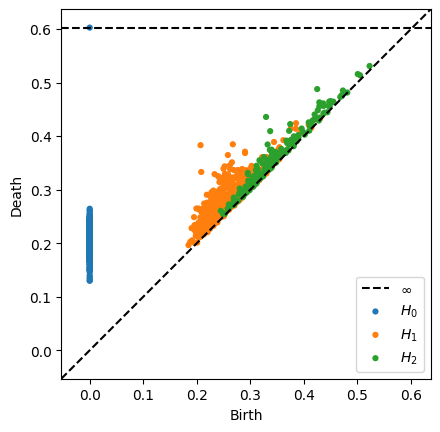

In [70]:
selected_indices = final_epoch_band_score_sort[-500:]
r = representations[-1][:, selected_indices]

diagrams = ripser(r, maxdim=2)["dgms"]

plot_diagrams(diagrams)

### Inspect Band Cells (cells with high band score)

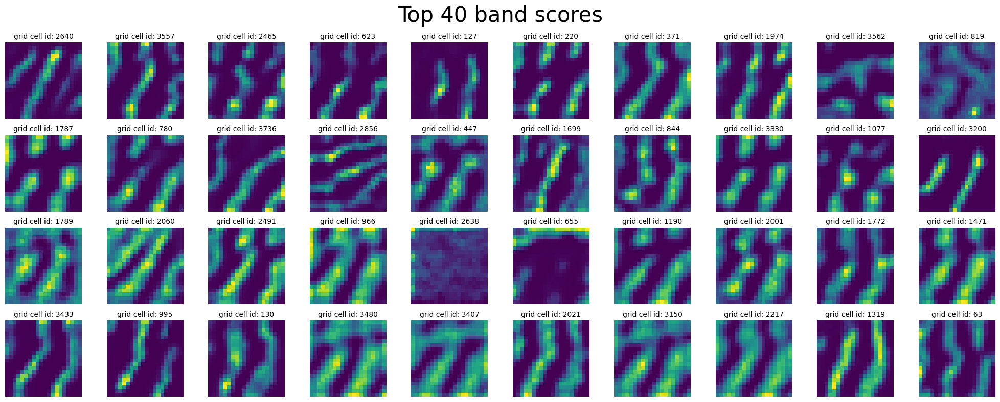

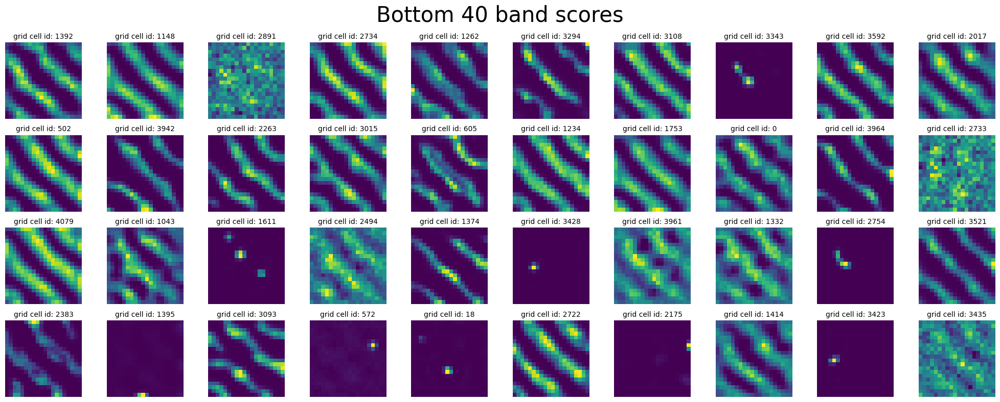

In [25]:
plot_rate_map(
    final_epoch_band_score_sort[-40:],
    None,
    single_agent_activations[-1],
    title="Top 40 band scores",
)

plot_rate_map(
    final_epoch_band_score_sort[:40],
    None,
    single_agent_activations[-1],
    title="Bottom 40 band scores",
)

^ why are do these cells have "low" band score ?

### Isolate Border cells (cells with high border score)

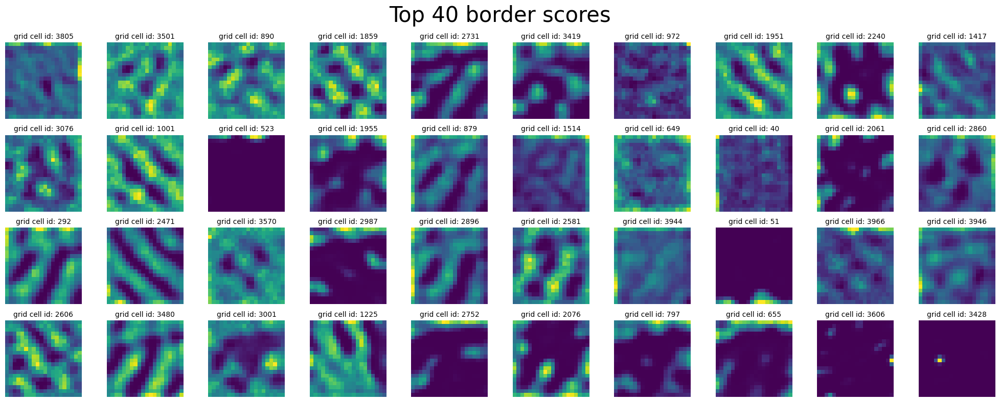

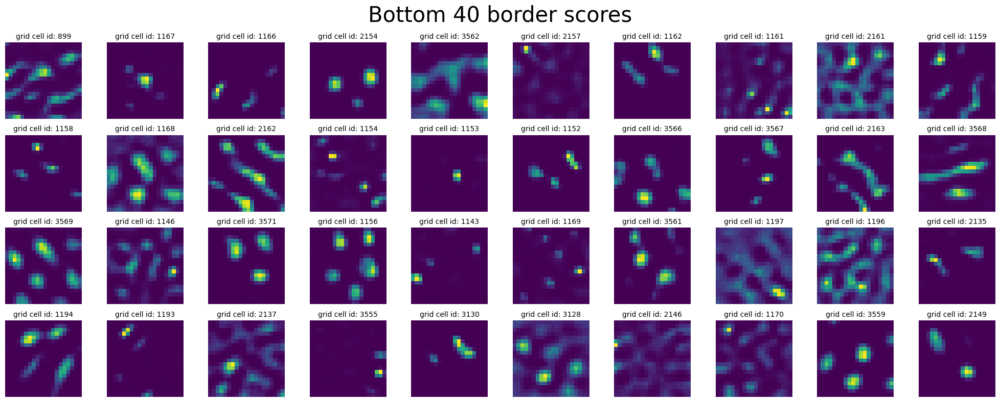

In [26]:
plot_rate_map(
    final_epoch_border_score_sort[-40:],
    None,
    single_agent_activations[-1],
    title="Top 40 border scores",
)

plot_rate_map(
    final_epoch_border_score_sort[:40],
    None,
    single_agent_activations[-1],
    title="Bottom 40 border scores",
)

### Compute Spatial Autocorrelation + UMAP

In [27]:
def compute_spatial_autocorrelation(res, rate_map_single_agent, scorer):
    print("Computing spatial auto-correlation...")
    _, _, _, _, spatial_autocorrelation, _ = zip(
        *[scorer.get_scores(rm.reshape(res, res)) for rm in tqdm(rate_map_single_agent)]
    )

    spatial_autocorrelation = np.array(spatial_autocorrelation)

    return spatial_autocorrelation

In [28]:
starts = [0.2] * 10
ends = np.linspace(0.4, 1.0, num=10)

box_width = 2.2
box_height = 2.2

res = 20

coord_range = ((-box_width / 2, box_width / 2), (-box_height / 2, box_height / 2))

masks_parameters = zip(starts, ends.tolist())
scorer = GridScorer(res, coord_range, masks_parameters)


# spatial_autocorrelations = []

# for _, epoch in enumerate(epochs):

spatial_autocorrelation = compute_spatial_autocorrelation(
    res, single_agent_rate_maps[-1], scorer
)

print(spatial_autocorrelation.shape)

Computing spatial auto-correlation...


  3%|▎         | 143/4096 [00:01<00:30, 128.83it/s]

100%|██████████| 4096/4096 [00:31<00:00, 129.28it/s]

(4096, 39, 39)


In [29]:
def z_standardize(matrix):
    return (matrix - np.mean(matrix, axis=0)) / np.std(matrix, axis=0)


def vectorized_spatial_autocorrelation_matrix(spatial_autocorrelation):
    num_cells = spatial_autocorrelation.shape[0]
    num_bins = spatial_autocorrelation.shape[1] * spatial_autocorrelation.shape[2]

    spatial_autocorrelation_matrix = np.zeros((num_bins, num_cells))

    for i in range(num_cells):
        vector = spatial_autocorrelation[i].flatten()

        spatial_autocorrelation_matrix[:, i] = vector

    return z_standardize(spatial_autocorrelation_matrix)

In [30]:
spatial_autocorrelation_matrix = vectorized_spatial_autocorrelation_matrix(
    spatial_autocorrelation
)

print(spatial_autocorrelation_matrix.shape)

(1521, 4096)


In [32]:
import umap

umap_reducer_2d = umap.UMAP(n_components=2, random_state=42)

umap_embedding = umap_reducer_2d.fit_transform(spatial_autocorrelation_matrix.T)

print(umap_embedding.shape)

(4096, 2)


In [37]:
from sklearn.manifold import TSNE

tsne_reducer_2d = TSNE(n_components=2, random_state=42)

tsne_embedding = tsne_reducer_2d.fit_transform(spatial_autocorrelation_matrix.T)

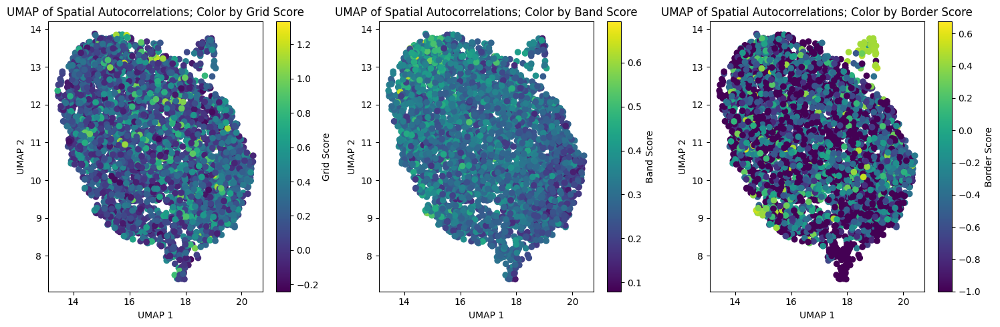

In [33]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot for Grid Scores
sc1 = axs[0].scatter(
    umap_embedding[:, 0],
    umap_embedding[:, 1],
    c=grid_scores_all_epochs[-1],
    cmap="viridis",
)
axs[0].set_xlabel("UMAP 1")
axs[0].set_ylabel("UMAP 2")
axs[0].set_title("UMAP of Spatial Autocorrelations; Color by Grid Score")
fig.colorbar(sc1, ax=axs[0], orientation="vertical", label="Grid Score")

# Plot for Band Scores
sc2 = axs[1].scatter(
    umap_embedding[:, 0],
    umap_embedding[:, 1],
    c=band_scores_all_epochs[-1],
    cmap="viridis",
)
axs[1].set_xlabel("UMAP 1")
axs[1].set_ylabel("UMAP 2")
axs[1].set_title("UMAP of Spatial Autocorrelations; Color by Band Score")
fig.colorbar(sc2, ax=axs[1], orientation="vertical", label="Band Score")

# Plot for Border Scores
sc3 = axs[2].scatter(
    umap_embedding[:, 0],
    umap_embedding[:, 1],
    c=border_scores_all_epochs[-1],
    cmap="viridis",
)
axs[2].set_xlabel("UMAP 1")
axs[2].set_ylabel("UMAP 2")
axs[2].set_title("UMAP of Spatial Autocorrelations; Color by Border Score")
fig.colorbar(sc3, ax=axs[2], orientation="vertical", label="Border Score")

plt.tight_layout()

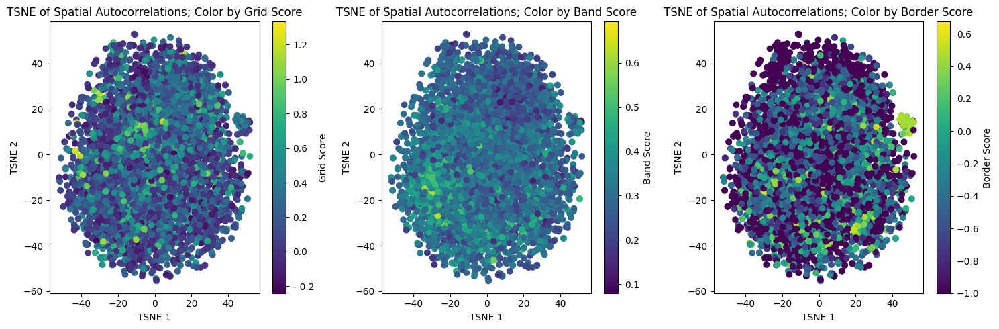

In [38]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot for Grid Scores
sc1 = axs[0].scatter(
    tsne_embedding[:, 0],
    tsne_embedding[:, 1],
    c=grid_scores_all_epochs[-1],
    cmap="viridis",
)
axs[0].set_xlabel("TSNE 1")
axs[0].set_ylabel("TSNE 2")
axs[0].set_title("TSNE of Spatial Autocorrelations; Color by Grid Score")
fig.colorbar(sc1, ax=axs[0], orientation="vertical", label="Grid Score")

# Plot for Band Scores
sc2 = axs[1].scatter(
    tsne_embedding[:, 0],
    tsne_embedding[:, 1],
    c=band_scores_all_epochs[-1],
    cmap="viridis",
)
axs[1].set_xlabel("TSNE 1")
axs[1].set_ylabel("TSNE 2")
axs[1].set_title("TSNE of Spatial Autocorrelations; Color by Band Score")
fig.colorbar(sc2, ax=axs[1], orientation="vertical", label="Band Score")

# Plot for Border Scores
sc3 = axs[2].scatter(
    tsne_embedding[:, 0],
    tsne_embedding[:, 1],
    c=border_scores_all_epochs[-1],
    cmap="viridis",
)
axs[2].set_xlabel("TSNE 1")
axs[2].set_ylabel("TSNE 2")
axs[2].set_title("TSNE of Spatial Autocorrelations; Color by Border Score")
fig.colorbar(sc3, ax=axs[2], orientation="vertical", label="Border Score")

plt.tight_layout()

In [71]:
reducer_3d = umap.UMAP(n_components=3, random_state=42)

embedding_3d = reducer_3d.fit_transform(spatial_autocorrelation_matrix.T)

print(embedding_3d.shape)

(4096, 2)


In [72]:
import plotly.graph_objects as go

fig = go.Figure(
    data=[
        go.Scatter3d(
            x=embedding_3d[:, 0],
            y=embedding_3d[:, 1],
            z=embedding_3d[:, 2],
            mode="markers",
            marker=dict(
                size=5,
                color=grid_scores_all_epochs[-1],
                colorscale="Viridis",
                opacity=0.8,
                colorbar=dict(title="Grid Score"),
            ),
        )
    ]
)

fig.update_layout(
    title="3D UMAP Visualization of Spatial Autocorrelations; Color by Grid Score",
    scene=dict(xaxis_title="UMAP 1", yaxis_title="UMAP 2", zaxis_title="UMAP 3"),
    margin=dict(l=0, r=0, b=0, t=30),
)

fig.show()

In [73]:
fig = go.Figure(
    data=[
        go.Scatter3d(
            x=embedding_3d[:, 0],
            y=embedding_3d[:, 1],
            z=embedding_3d[:, 2],
            mode="markers",
            marker=dict(
                size=5,
                color=band_scores_all_epochs[-1],
                colorscale="Viridis",
                opacity=0.8,
                colorbar=dict(title="Band Score"),
            ),
        )
    ]
)

fig.update_layout(
    title="3D UMAP Visualization of Spatial Autocorrelations; Color by Band Score",
    scene=dict(xaxis_title="UMAP 1", yaxis_title="UMAP 2", zaxis_title="UMAP 3"),
    margin=dict(l=0, r=0, b=0, t=30),
)

fig.show()

In [74]:
fig = go.Figure(
    data=[
        go.Scatter3d(
            x=embedding_3d[:, 0],
            y=embedding_3d[:, 1],
            z=embedding_3d[:, 2],
            mode="markers",
            marker=dict(
                size=5,
                color=border_scores_all_epochs[-1],
                colorscale="Viridis",
                opacity=0.8,
                colorbar=dict(title="Border Score"),
            ),
        )
    ]
)

fig.update_layout(
    title="3D UMAP Visualization of Spatial Autocorrelations; Color by Border Score",
    scene=dict(xaxis_title="UMAP 1", yaxis_title="UMAP 2", zaxis_title="UMAP 3"),
    margin=dict(l=0, r=0, b=0, t=30),
)

fig.show()

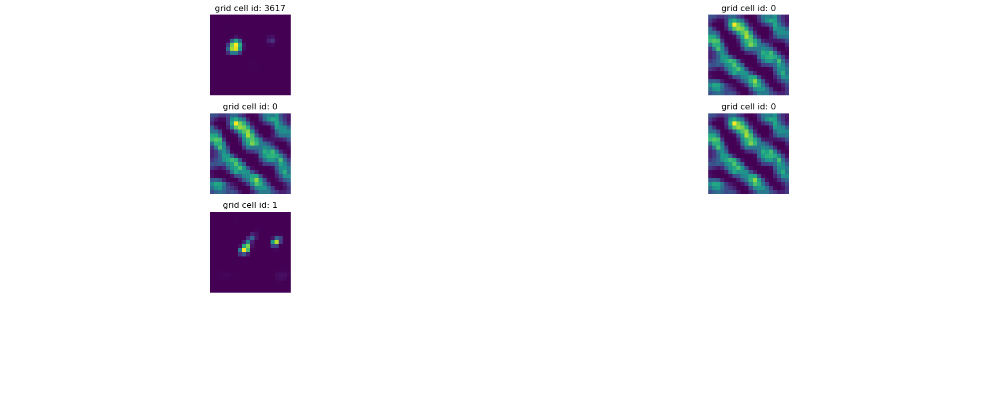

In [29]:
from neurometry.datasets.load_rnn_grid_cells import plot_rate_map

plot_rate_map([3617, 0, 0, 0, 1], 40, single_agent_activations[-1])

### Discover "modules" through clustering / dim reduction? (see Gardner Extended Data Fig. 2)

In [26]:
# parent_dir = os.getcwd() + "/datasets/rnn_grid_cells/"

parent_dir = "/scratch/facosta/rnn_grid_cells/"

single_model_folder = "Single agent path integration/Seed 1 weight decay 1e-06/"
single_model_parameters = "steps_20_batch_200_RNN_4096_relu_rf_012_DoG_True_periodic_False_lr_00001_weight_decay_1e-06/"

saved_model_single_agent = torch.load(
    parent_dir + single_model_folder + single_model_parameters + "final_model.pth"
)


print(f"The model is a dictionary with keys {saved_model_single_agent.keys()}")

The model is a dictionary with keys odict_keys(['encoder.weight', 'RNN.weight_ih_l0', 'RNN.weight_hh_l0', 'decoder.weight'])


Extract the recurrent connectivity matrix:

In [27]:
W = saved_model_single_agent["RNN.weight_hh_l0"].detach().numpy()
print(f"W has dimensions {W.shape}")

W has dimensions (4096, 4096)


Find singular values of $W$:

In [33]:
singular_values = np.linalg.svd(W, compute_uv=False)

Plot singular value spectrum:

Number of components to explain 90.0% of variance: 372


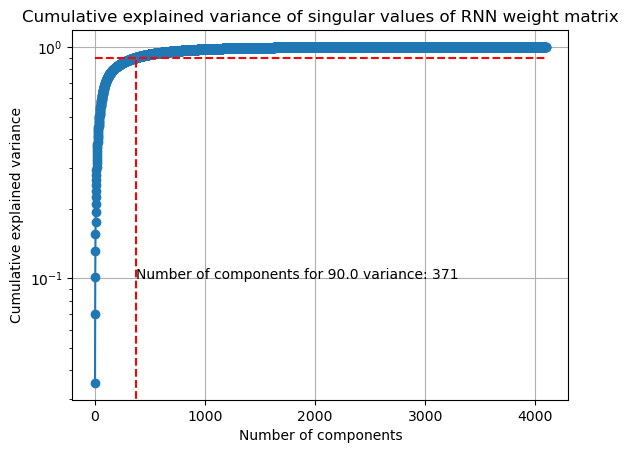

In [57]:
ev_threshold = 0.9

explained_variance = singular_values**2 / np.sum(singular_values**2)

cumulative_explained_variance = np.cumsum(explained_variance)

plt.plot(cumulative_explained_variance, "o-")

plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")

plt.yscale("log")
plt.grid()


plt.title("Cumulative explained variance of singular values of RNN weight matrix")

plt.hlines(
    ev_threshold, 0, len(cumulative_explained_variance), linestyles="dashed", colors="r"
)

plt.vlines(
    np.where(cumulative_explained_variance >= ev_threshold)[0][0],
    0,
    ev_threshold,
    linestyles="dashed",
    colors="r",
)

# show number of components to explain 90% of variance on x-axis
plt.text(
    np.where(cumulative_explained_variance >= ev_threshold)[0][0],
    0.1,
    f"Number of components for {100*ev_threshold} variance: {np.where(cumulative_explained_variance >= ev_threshold)[0][0]}",
)


num_components = np.where(cumulative_explained_variance >= ev_threshold)[0][0] + 1

print(
    f"Number of components to explain {100*ev_threshold}% of variance: {num_components}"
)

## Dual-Agent RNN

### Load activations across training epochs

In [97]:
epochs = list(range(0, 100, 5))
(
    dual_agent_activations,
    dual_agent_rate_maps,
    dual_agent_state_points,
) = load_activations(epochs, version="dual", verbose=True)

Epoch 0 found!!! :D
Epoch 5 found!!! :D
Epoch 10 found!!! :D
Epoch 15 found!!! :D
Epoch 20 found!!! :D
Epoch 25 found!!! :D
Epoch 30 found!!! :D
Epoch 35 found!!! :D
Epoch 40 found!!! :D
Epoch 45 found!!! :D
Epoch 50 found!!! :D
Epoch 55 found!!! :D
Epoch 60 found!!! :D
Epoch 65 found!!! :D
Epoch 70 found!!! :D
Epoch 75 found!!! :D
Epoch 80 found!!! :D
Epoch 85 found!!! :D
Epoch 90 found!!! :D
Epoch 95 found!!! :D
Loaded epochs [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95] of dual agent model.
There are 4096 grid cells with 20 x 20 environment resolution, averaged over 50 trajectories.
There are 20000 data points in the 4096-dimensional state space.
There are 400 data points averaged over 50 trajectories in the 4096-dimensional state space.


### Plot final activations

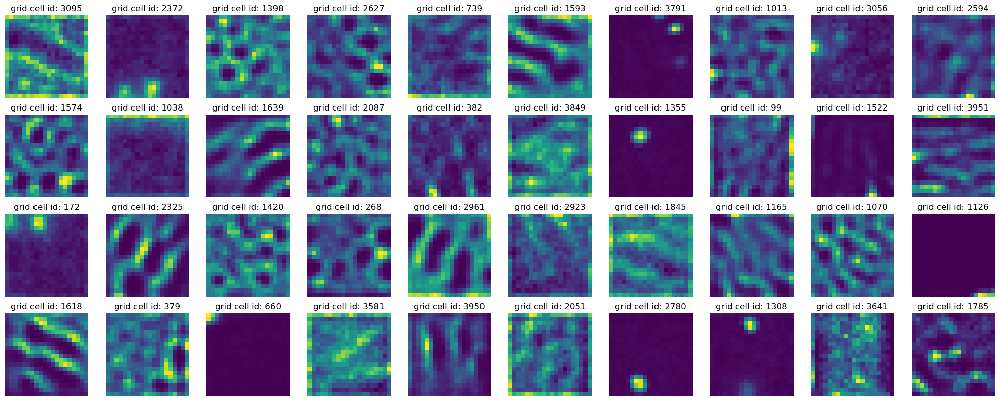

In [98]:
plot_rate_map(40, dual_agent_activations[-1])

### Extract dual agent representations from epoch = 0 to epoch = 95

In [99]:
dual_representations = []

for rep in dual_agent_rate_maps:
    points = rep.T
    norm_points = points / np.linalg.norm(points, axis=1)[:, None]
    dual_representations.append(norm_points)

### Load training loss

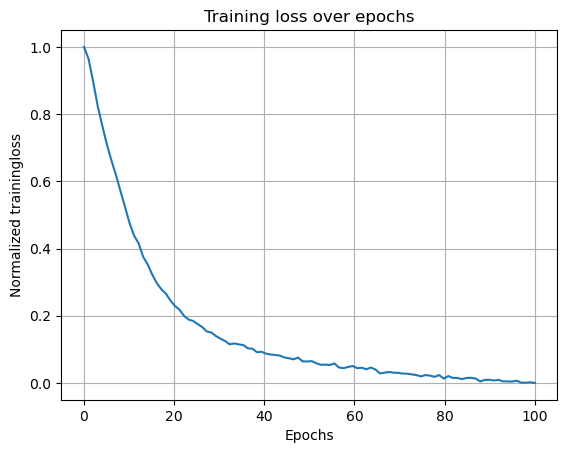

In [103]:
model_folder = "Dual agent path integration disjoint PCs/Seed 1 weight decay 1e-06/"
model_parameters = "steps_20_batch_200_RNN_4096_relu_rf_012_DoG_True_periodic_False_lr_00001_weight_decay_1e-06/"

loss_path = (
    os.getcwd()
    + "/datasets/rnn_grid_cells/"
    + model_folder
    + model_parameters
    + "loss.npy"
)

loss = np.load(loss_path)

loss_aggregated = np.mean(loss.reshape(-1, 1000), axis=1)

loss_normalized = (loss_aggregated - np.min(loss_aggregated)) / (
    np.max(loss_aggregated) - np.min(loss_aggregated)
)

plt.plot(np.linspace(0, 100, 100), loss_normalized)
plt.xlabel("Epochs")
plt.ylabel("Normalized trainingloss")
plt.title("Training loss over epochs")
plt.grid()

## Estimate Dimension

In [3]:
neural_manifold = rate_maps.T


num_trials = 10
# methods = [method for method in dir(skdim.id) if not method.startswith("_")]
methods = ["MLE", "KNN", "TwoNN", "CorrInt", "lPCA"]

id_estimates = {}
for method_name in methods:
    method = getattr(skdim.id, method_name)()
    estimates = np.zeros(num_trials)
    for trial_idx in range(num_trials):
        method.fit(neural_manifold)
        estimates[trial_idx] = np.mean(method.dimension_)
    id_estimates[method_name] = estimates

In [6]:
neural_manifold.shape

(400, 4096)

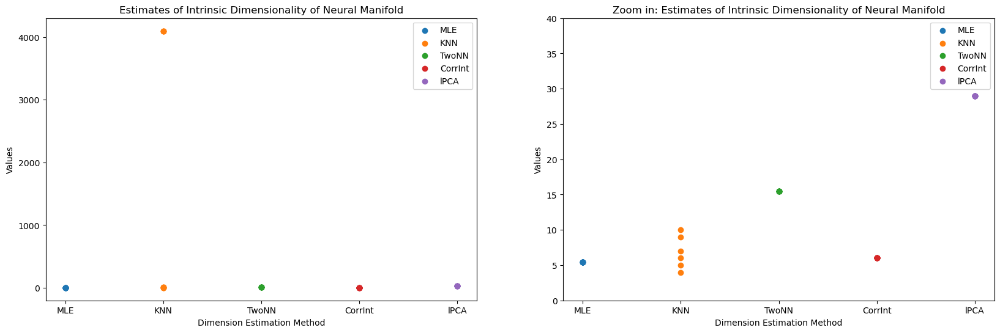

In [18]:
# make side by side plots
fig, axes = plt.subplots(1, 2, figsize=(20, 6))

for i, method in enumerate(methods):
    y = id_estimates[method]
    x = np.repeat(i, len(y))
    axes[0].scatter(x, y, label=method)
    axes[1].scatter(x, y, label=method)

axes[0].set_xticks(range(len(methods)))
axes[0].set_xticklabels(methods)
axes[0].set_xlabel("Dimension Estimation Method")
axes[0].set_ylabel("Values")
axes[0].set_title("Estimates of Intrinsic Dimensionality of Neural Manifold")
axes[0].legend()

axes[1].set_xticks(range(len(methods)))
axes[1].set_xticklabels(methods)
axes[1].set_xlabel("Dimension Estimation Method")
axes[1].set_ylabel("Values")
axes[1].set_ylim([0, 40])
axes[1].set_title("Zoom in: Estimates of Intrinsic Dimensionality of Neural Manifold")
axes[1].legend();

estimate extrinsic with PCA, then do nonlinear dim est